Monto el drive:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


[Señales a utilizar](https://drive.google.com/drive/folders/1cLwXQrwSZbNowBZX2rRpeydKOpydvHQn?usp=sharing)

Importo librerías que voy a utilizar:

In [ ]:
import numpy as np
import scipy.signal
import matplotlib.pyplot as plt
import scipy.io
from scipy.fft import fft

# LECTURA DE ARCHIVO DE EEG


Cargamos el archivo `eeg_epilepsia.mat`:

In [ ]:
arch = scipy.io.loadmat('/content/drive/MyDrive/Clase EEG1 - Señales/eeg_epilepsia.mat')

In [ ]:
arch

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Sun May  3 15:18:03 2020',
 '__version__': '1.0',
 '__globals__': [],
 'data': array([[(array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                   6.44688645,   8.4004884 ],
                [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                  34.18803419,  43.56532357],
                [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                   6.83760684,   8.00976801],
                ...,
                [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                 -18.16849817, -25.2014652 ],
                [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                 -34.57875458, -32.23443223],
                [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                  42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..

In [ ]:
type(arch)

dict

In [ ]:
print(sorted(arch.keys()))

['__globals__', '__header__', '__version__', 'data']


Veo qué hay dentro de la key `data` del archivo cargado:


In [ ]:
data = arch['data']
data

array([[(array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                  6.44688645,   8.4004884 ],
               [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                 34.18803419,  43.56532357],
               [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                  6.83760684,   8.00976801],
               ...,
               [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                -18.16849817, -25.2014652 ],
               [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                -34.57875458, -32.23443223],
               [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                 42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
                3155.99609375, 3156.        ]]))                                                                                              

In [ ]:
type(data)

numpy.ndarray

In [ ]:
type(data[0])

numpy.ndarray

In [ ]:
data[0]

array([(array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                 6.44688645,   8.4004884 ],
              [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                34.18803419,  43.56532357],
              [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                 6.83760684,   8.00976801],
              ...,
              [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
               -18.16849817, -25.2014652 ],
              [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
               -34.57875458, -32.23443223],
              [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
               3155.99609375, 3156.        ]]))                                                                                                     ],
    

In [ ]:
data[0][0]

(array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
          6.44688645,   8.4004884 ],
       [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
         34.18803419,  43.56532357],
       [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
          6.83760684,   8.00976801],
       ...,
       [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
        -18.16849817, -25.2014652 ],
       [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
        -34.57875458, -32.23443223],
       [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
         42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
        3155.99609375, 3156.        ]]))

In [ ]:
type(data[0][0])

numpy.void



> ¿Qué es un numpy void?
[Link 1](https://numpy.org/doc/stable/reference/arrays.scalars.html#numpy.void)
[Link 2](https://numpy.org/doc/stable/reference/arrays.dtypes.html)



Para poder llamar a cada partecita de data, hay que manejarlo como si fuera un diccionario (aunque claramente no lo es, sino que es un numpy array como se vió anteriormente)

In [ ]:
x = data['x']
x

array([[array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                  6.44688645,   8.4004884 ],
               [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                 34.18803419,  43.56532357],
               [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                  6.83760684,   8.00976801],
               ...,
               [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                -18.16849817, -25.2014652 ],
               [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                -34.57875458, -32.23443223],
               [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                 42.002442  ,  38.0952381 ]])                               ]],
      dtype=object)

In [ ]:
fs = data['fs']
fs

array([[array([[256]], dtype=uint16)]], dtype=object)

In [ ]:
tiempo = data['tiempo']
tiempo

array([[array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
                3155.99609375, 3156.        ]])                                 ]],
      dtype=object)

In [ ]:
tiempo[0][0].shape

(1, 71681)

Veamos qué hay en `x` y el tamaño que tiene:

In [ ]:
x.shape

(1, 1)

In [ ]:
x

array([[array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                  6.44688645,   8.4004884 ],
               [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                 34.18803419,  43.56532357],
               [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                  6.83760684,   8.00976801],
               ...,
               [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                -18.16849817, -25.2014652 ],
               [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                -34.57875458, -32.23443223],
               [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                 42.002442  ,  38.0952381 ]])                               ]],
      dtype=object)

Se puede ver que los datos dentro de `data` están como en "capas" escondidos. Veamos qué hay dentro para sacarle esas capas a los datos:

In [ ]:
x[0].shape # tamaño de la primer capa

(1,)

In [ ]:
x[0][0].shape # tamaño de la segunda capa

(23, 71681)



<font color='yellow'>¿A qué hace referencia este tamaño?</font>

23 --> canales

71681 --> muestras tomadas

In [ ]:
data['fs']

array([[array([[256]], dtype=uint16)]], dtype=object)

También está dentro de varias capas, por ende el valor se obtiene de la siguiente manera:

In [ ]:
data['fs'][0][0][0][0]

256

<font color='yellow'>¿Cuántos segundos de la señal hay registrados?</font>


In [ ]:
print('Se registraron', x[0][0].shape[1]/data['fs'][0][0][0][0] , 'segundos')

Se registraron 280.00390625 segundos


Defino las variables :

*   `x`: matriz donde en cada fila están los canales cargados
*   `fs`: frecuencia de muestreo
*   `t`: vector tiempo
*   `cant_canales`: cantidad de canales dentro de x



In [ ]:
x = x[0][0]
fs = fs[0][0][0][0]
t = tiempo[0][0]
cant_canales = x.shape[0]

In [ ]:
x.shape[1] == len(t[0])

True

Analizo qué onda las dimensiones de `x` y `tiempo`:

In [ ]:
x[0].shape

(71681,)

In [ ]:
t.shape

(1, 71681)

El vector tiempo está "dado vuelta", por ende lo transpongo para que coincida con la información en cada canal y al mismo tiempo le sacó la dimensión de más que tiene:

In [ ]:
t = t.T

In [ ]:
t.shape

(71681, 1)

In [ ]:
t

array([[2876.        ],
       [2876.00390625],
       [2876.0078125 ],
       ...,
       [3155.9921875 ],
       [3155.99609375],
       [3156.        ]])

In [ ]:
t = t.ravel() # le saca la dimensión de más que tiene

In [ ]:
t.shape

(71681,)



> [numpy.ravel](https://numpy.org/doc/stable/reference/generated/numpy.ravel.html)



Me va a ser de utilidad este arreglo para más adelante:

In [ ]:
canales = np.arange(0,cant_canales)+1
canales

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23])

# VISUALIZACIÓN DE EEG

### Canales por separados

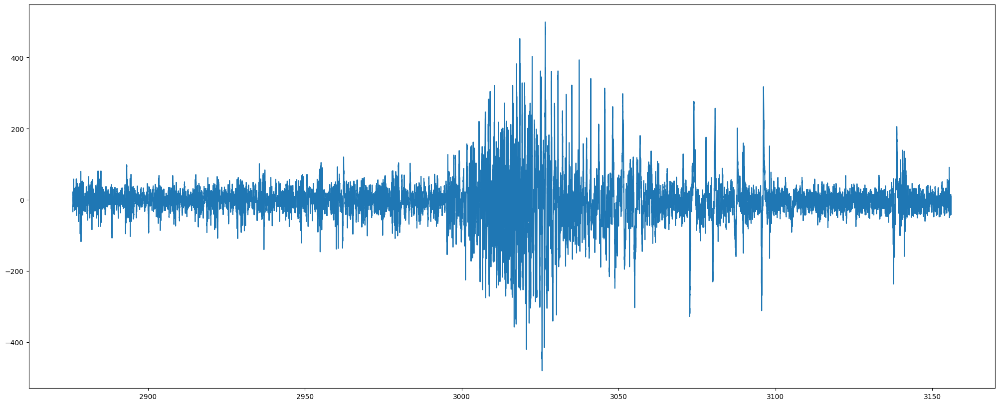

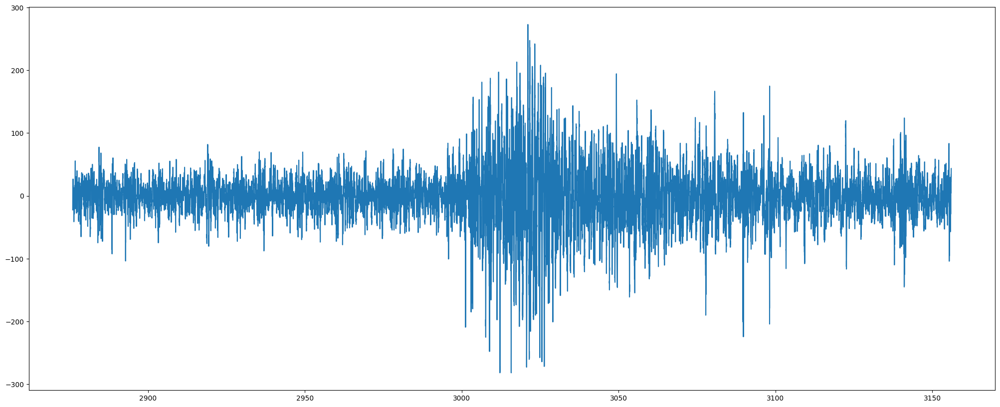

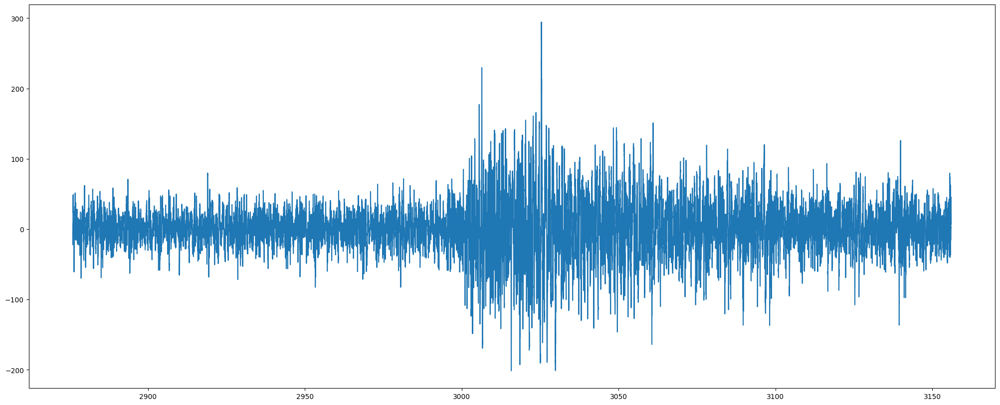

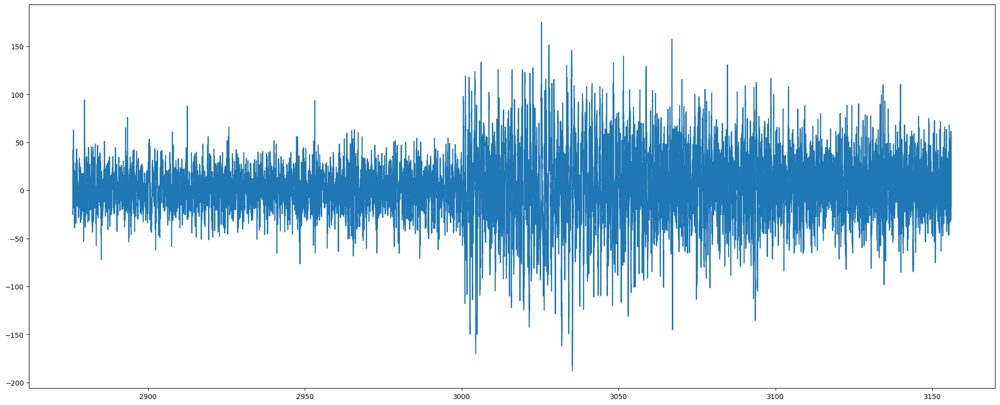

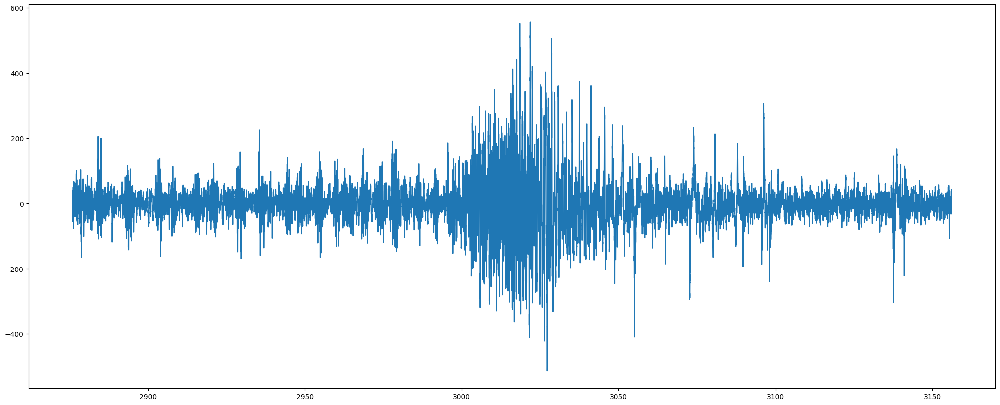

...

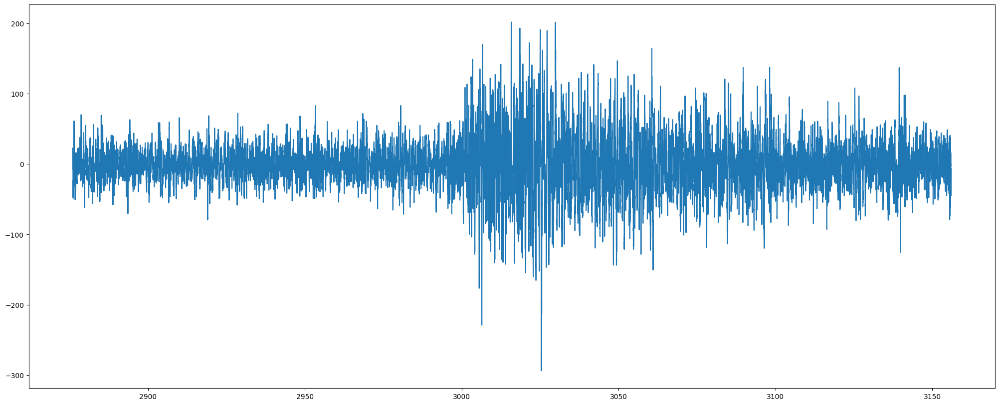

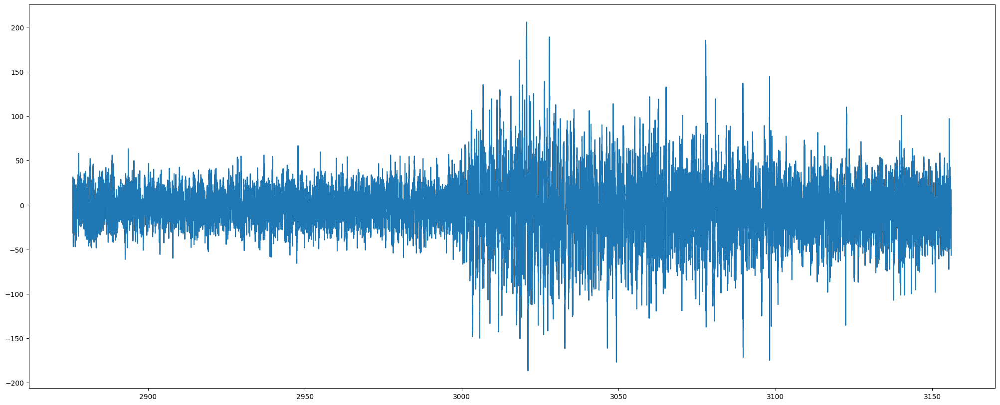

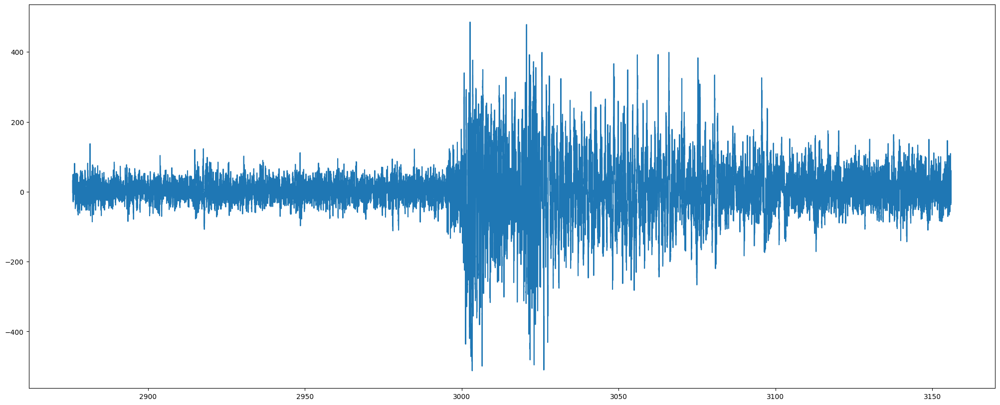

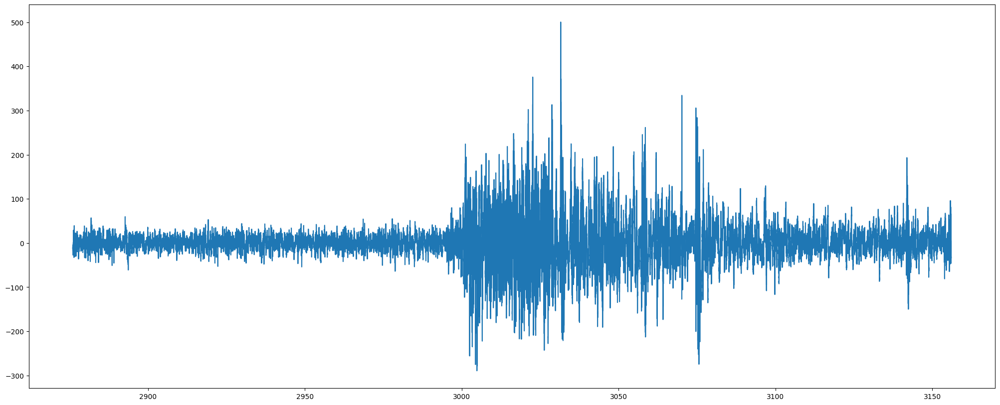

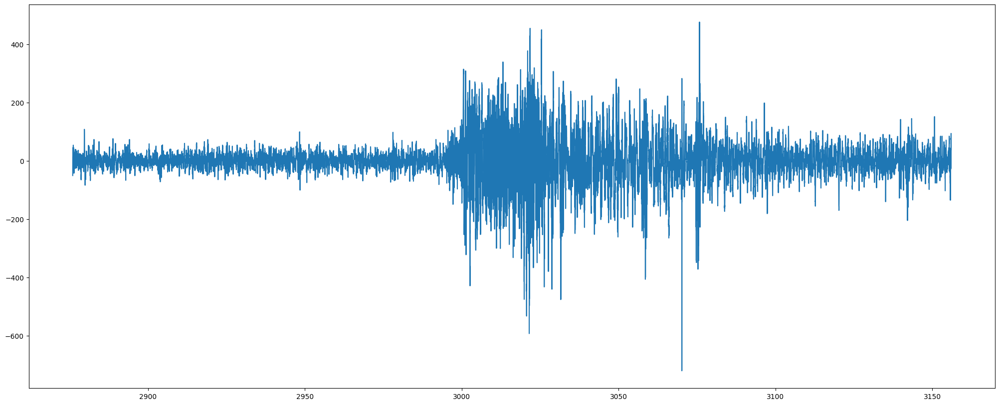

In [ ]:
for c in canales:
  plt.figure(figsize=(25,10))
  titulo = 'Canal' + str(c+1)
  plt.plot(t, x[c-1])
  plt.show()

### Gráfico mariposa

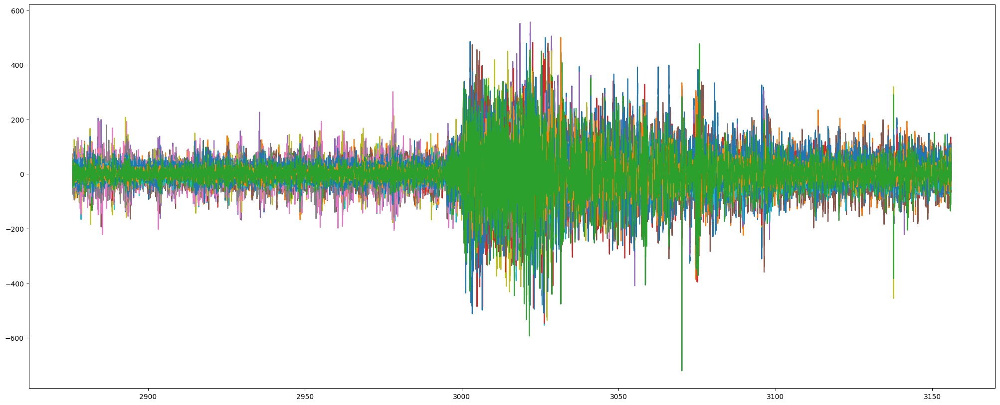

In [ ]:
plt.figure(figsize=(25,10))
for c in canales:
  titulo = 'Canal' + str(c+1)
  plt.plot(t, x[c-1])

plt.show()

### Canales juntos

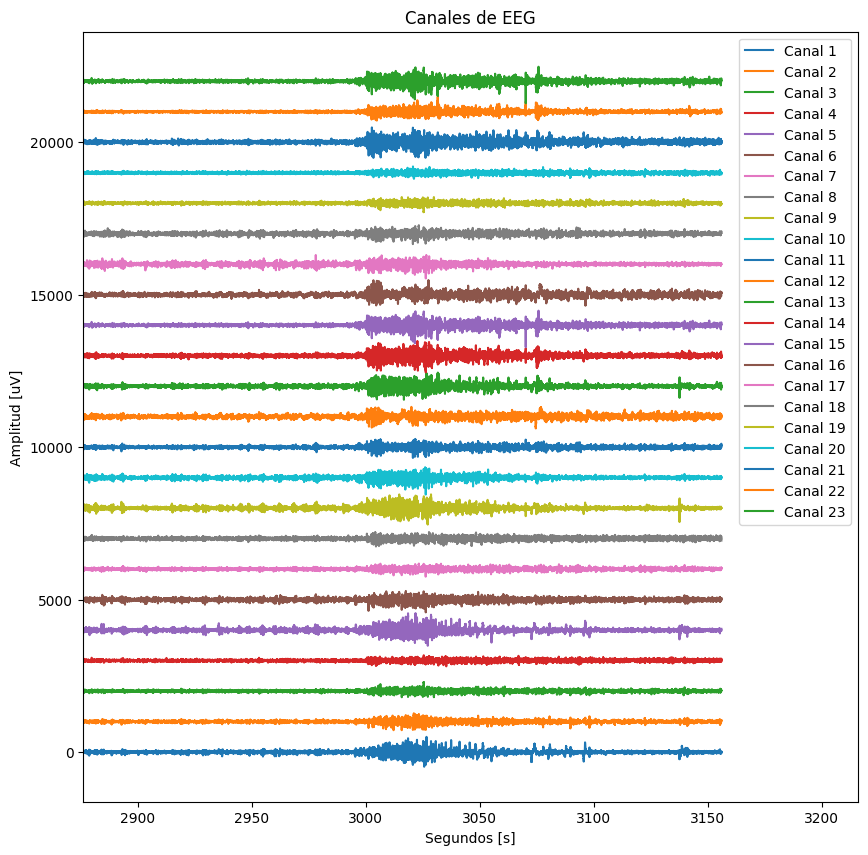

In [ ]:
plt.figure(figsize=(10,10))
i = 0
titulo = 'Canales de EEG'

for c in canales:
  plt.plot(t,x[c-1]-i, label = f'Canal {c}')
  i = i - 1000

plt.xlabel('Segundos [s]')
plt.ylabel('Amplitud [uV]')
plt.xlim([t[0],t[-1]+60])
plt.title(titulo)
plt.legend(loc = 'upper right')
plt.show()

# MODELADO DE EEG

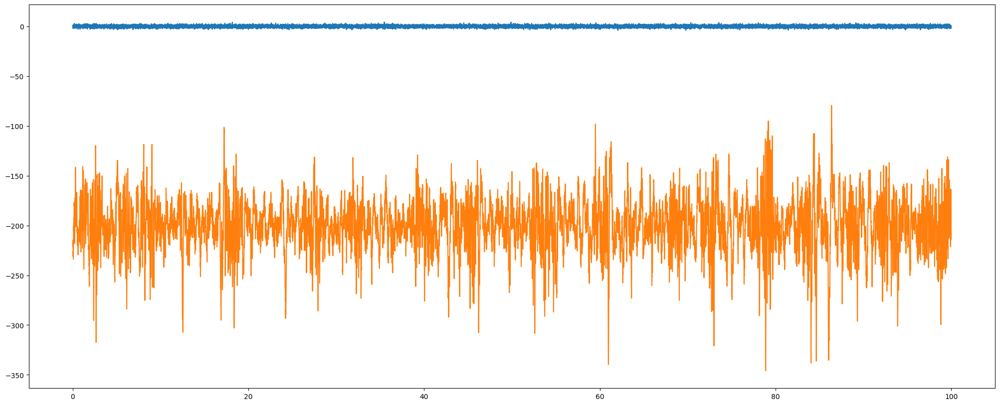

In [ ]:
modelo = np.random.normal(0,1,fs*100)
t_modelo = np.linspace(0, 100, fs*100)

plt.figure(figsize=(25,10))
plt.plot(t_modelo, modelo, label='Modelo')
plt.plot(t_modelo, x[0][:100*fs]-200, label='Canal 1 EEG')
plt.show()

In [ ]:
print(np.mean(modelo))
print(np.mean(x[0][:100*fs]))

0.0028983498521755833
0.18759157509157437


In [ ]:
print(np.std(modelo))
print(np.std(x[0][:100*fs]))

0.9955260903954319
26.431559723396575


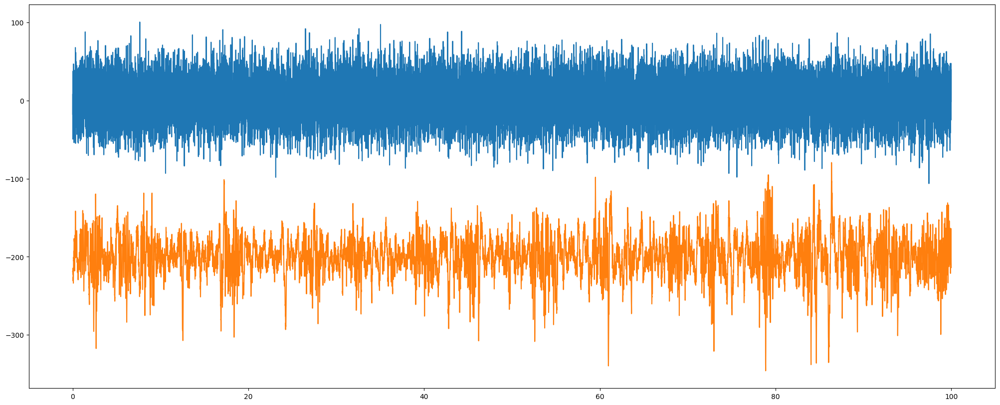

In [ ]:
modelo = np.random.normal(0.18,26,fs*100)
t_modelo = np.linspace(0, 100, fs*100)

plt.figure(figsize=(25,10))
plt.plot(t_modelo, modelo, label='Modelo')
plt.plot(t_modelo, x[0][:100*fs]-200, label='Canal 1 EEG')
plt.show()

<font color = "yellow">¿A qué se debe esta diferencia?</font>

# RITMOS DEL EEG


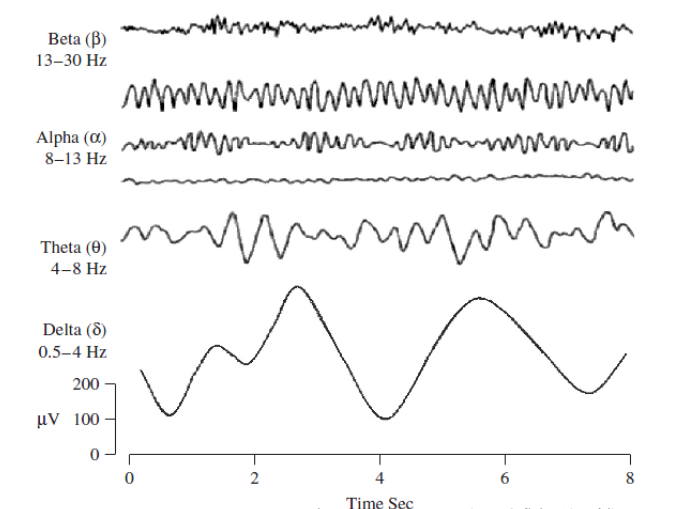

Definamos las bandas frecuenciales de cada ritmo en un diccionario para que sea más sencillo acceder a esta información:

In [ ]:
ritmos_cerebrales ={
            'delta': [1, 4],
            'theta': [4, 8],
            'alpha': [8, 13],
            'sigma': [13,15],
            'beta': [15, 30],
            'gamma': [30, 100]}

In [ ]:
ritmos_cerebrales['theta']

[4, 8]

<font color = "yellow">¿Cómo podemos evaluar "qué tan presentes" está cada ritmo en una tira de EEG?</font>

# ESPECTRO DEL EEG

[Fast Fourier Transform](https://docs.scipy.org/doc/scipy/tutorial/fft.html)

[matplotlib.pyplot.psd()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.psd.html)

[scipy.signal.welch()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.welch.html)

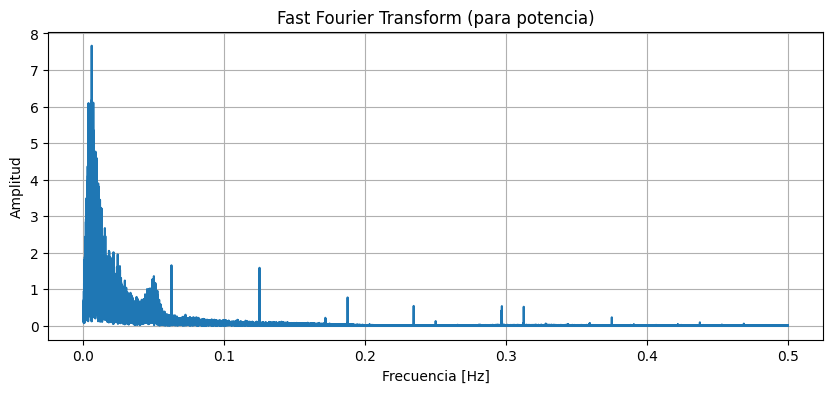

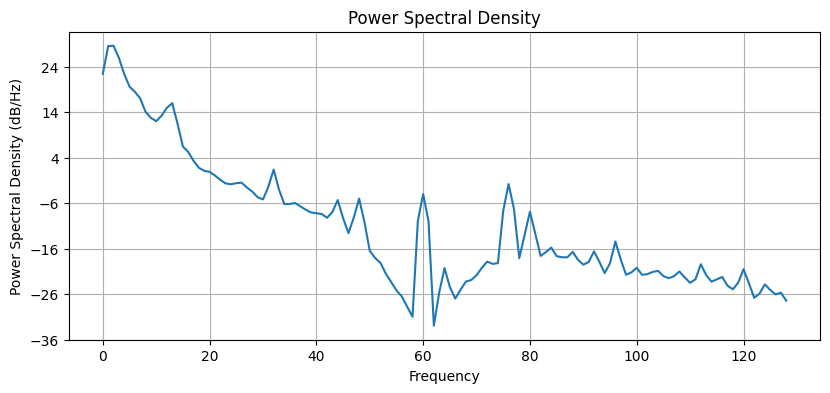

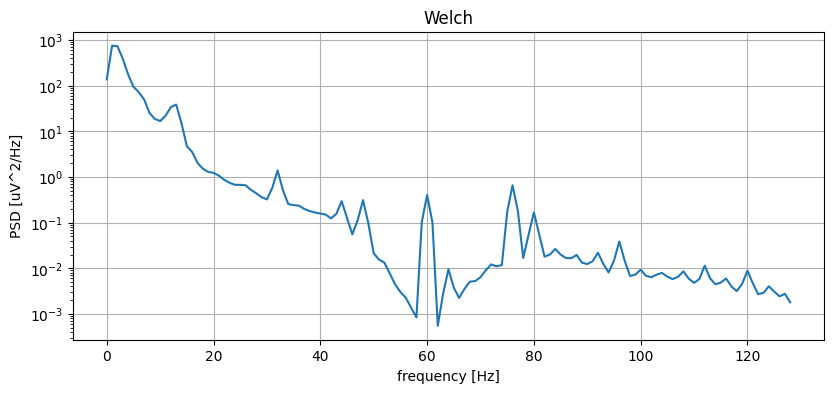

In [ ]:
canal = 18

canal_fft = fft(x[canal-1])
L = canal_fft.shape[0]

f = np.linspace(0,fs,L*fs)
y = 2.0/L * np.abs(canal_fft[0:int(L/2)])

plt.figure(figsize = (10,4))
plt.title('Fast Fourier Transform (para potencia)')
plt.plot(f[:int(L/2)],y)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.grid()
plt.show()

plt.figure(figsize = (9.7,4))
plt.title('Power Spectral Density')
plt.psd(x[canal-1], Fs=fs, NFFT=2**8) #Cambiar NFFT
plt.show()

nper = int(fs)
f, Pxx_den = scipy.signal.welch(x[canal-1], fs, noverlap=nper/2  , nperseg=nper)
plt.figure(figsize = (9.7,4))
plt.semilogy(f, Pxx_den)
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [uV^2/Hz]')
plt.title('Welch')
plt.grid()
plt.show()

# ESPECTROGRAMA DE UN EEG

<font color = "yellow">¿Qué podemos ver en el espectograma de una señal?</font>

[plt.specgram()](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.specgram.html#matplotlib.axes.Axes.specgram)

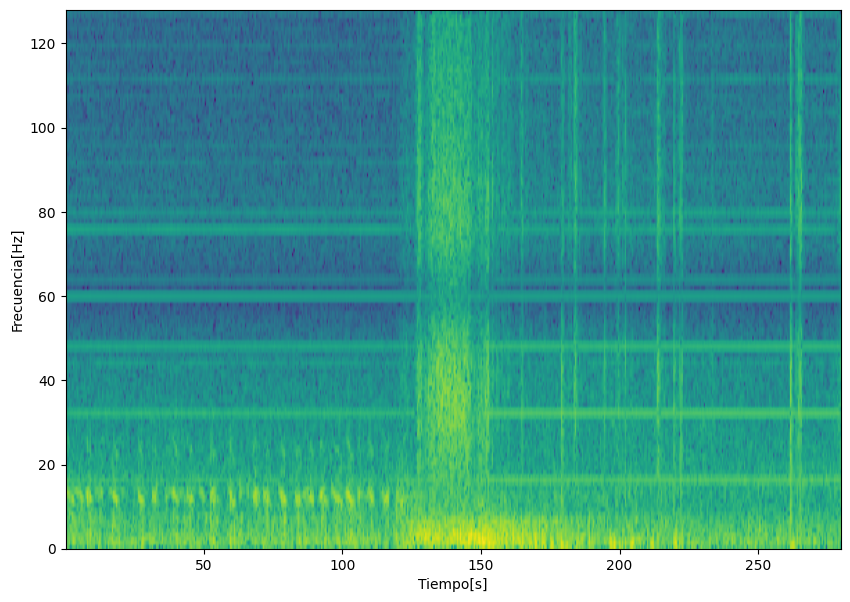

In [ ]:
canal = 4
plt.figure(figsize = (10,7))
spectrum, fr, ti, im = plt.specgram(x[canal], Fs=fs)
plt.xlabel('Tiempo[s]')
plt.ylabel('Frecuencia[Hz]')
plt.show()

In [ ]:
spectrum.shape

(129, 559)

In [ ]:
fr.shape

(129,)

In [ ]:
ti.shape

(559,)

In [ ]:
im

Tratemos de superponer el eeg en este espectrograma:

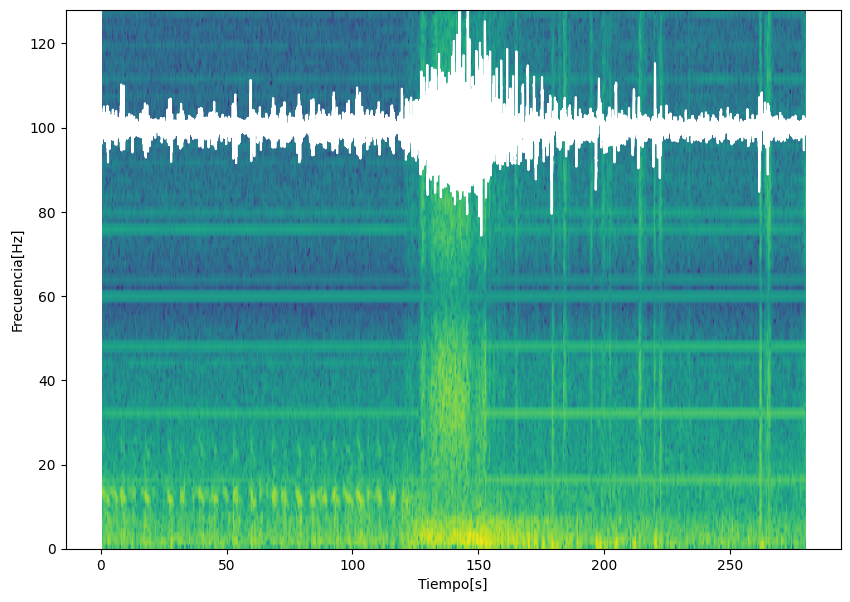

In [ ]:
canal = 4

t_reset = np.linspace(0, x[canal].shape[0]/fs , x[canal].shape[0]) #¿Por qué necesito hacer esto?

plt.figure(figsize = (10,7))
_ = plt.specgram(x[canal], Fs=fs)
plt.plot(t_reset,x[canal]*0.05+100,'w')
plt.xlabel('Tiempo[s]')
plt.ylabel('Frecuencia[Hz]')
plt.show()

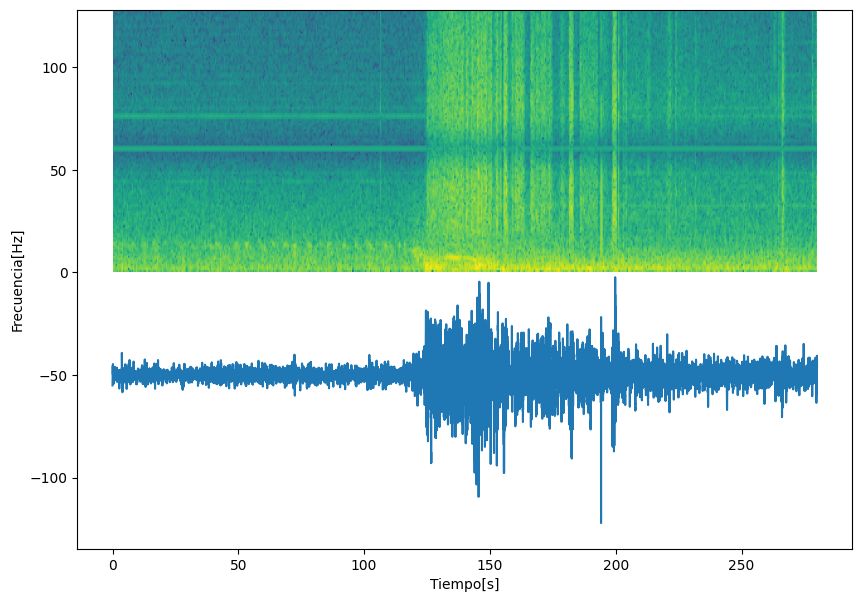

In [ ]:
canal = 14
plt.figure(figsize = (10,7))
plt.specgram(x[canal], Fs=fs)
plt.plot(t_reset,x[canal]*0.1-50)
plt.xlabel('Tiempo[s]')
plt.ylabel('Frecuencia[Hz]')
plt.show()

## Ejemplo con espectrograma de Chirp

[Chirp](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.chirp.html)

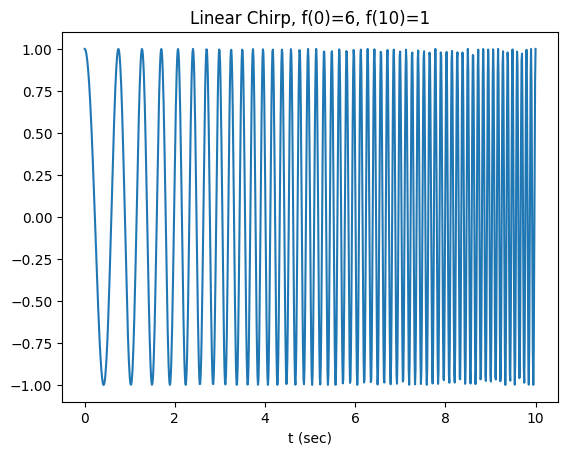

In [ ]:
fs_chirp = 100
t_end = 10
t_chirp = np.linspace(0, t_end, t_end*fs_chirp)
x_chirp = scipy.signal.chirp(t_chirp, f0=1, f1=10, t1=t_end, method='linear')
plt.plot(t_chirp, x_chirp)
plt.title("Linear Chirp, f(0)=6, f(10)=1")
plt.xlabel('t (sec)')
plt.show()

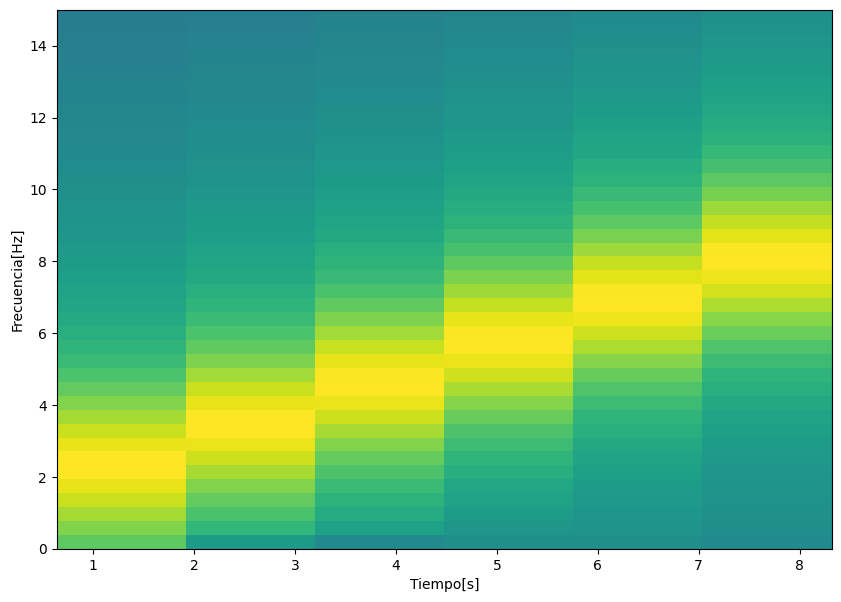

In [ ]:
plt.figure(figsize = (10,7))
plt.specgram(x_chirp, Fs=fs_chirp)
plt.xlabel('Tiempo[s]')
plt.ylabel('Frecuencia[Hz]')
plt.ylim([0,15])
plt.show()

# ELIMINACIÓN DE RUIDO EN EEG

Vamos a usar un filtro Butterworth mediante la función [scipy.signal.butter()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.butter.html)

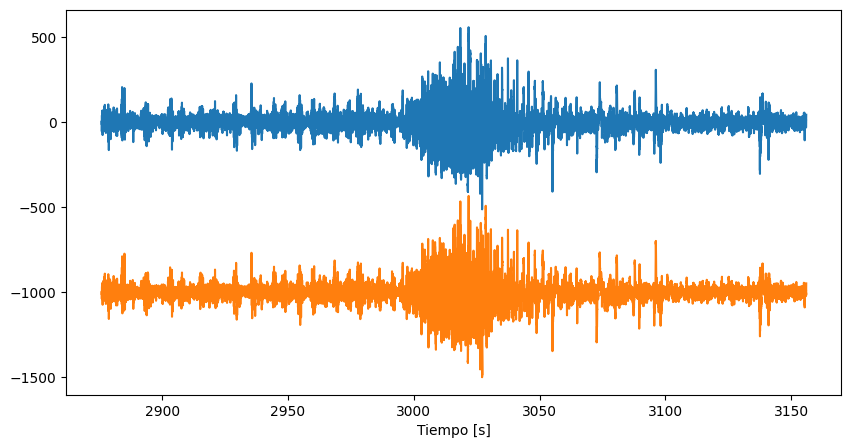

In [ ]:
N = 5
wn = [15,17] #Queremos eliminar el pico de 16Hz
canal = 4

[b,a] = scipy.signal.butter(N, wn, btype = 'bandstop', fs = fs)

filtrada = scipy.signal.lfilter(b,a,x[canal])

plt.figure(figsize=(10,5))
plt.plot(t,x[canal])
plt.plot(t,filtrada - 1000)
plt.xlabel('Tiempo [s]')
plt.show()

Vemos en detalle:

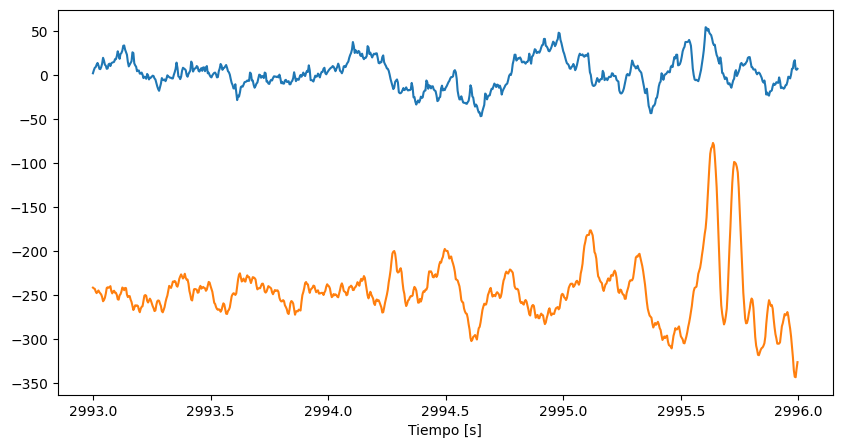

In [ ]:
pos_inic = 117 * fs
pos_fin = 120 * fs

plt.figure(figsize=(10,5))
plt.plot(t[pos_inic:pos_fin],x[canal-1][pos_inic:pos_fin])
plt.plot(t[pos_inic:pos_fin],filtrada[pos_inic:pos_fin]-250)
plt.xlabel('Tiempo [s]')
plt.show()

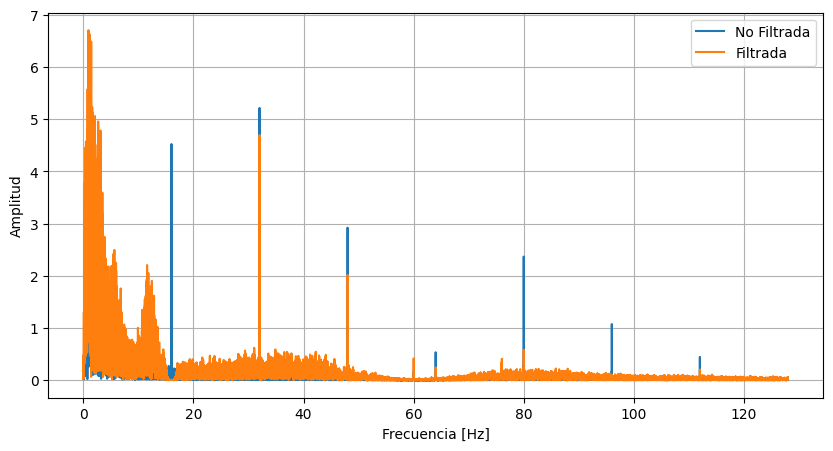

In [ ]:
filtrada_fft = fft(filtrada)
canal_fft = fft(x[canal-1])

L = filtrada_fft.shape[0]

f = np.linspace(0,1,L) * fs
y = 2.0/L * np.abs(canal_fft[0:int(L/2)])

f_filt = np.linspace(0,1,L) * fs
y_filt = 2.0/L * np.abs(filtrada_fft[0:int(L/2)])

plt.figure(figsize = (10,5))
plt.plot(f[:int(L/2)],y, label = 'No Filtrada')
plt.plot(f_filt[:int(L/2)],y_filt, label = 'Filtrada')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.legend()
plt.grid()
plt.show()

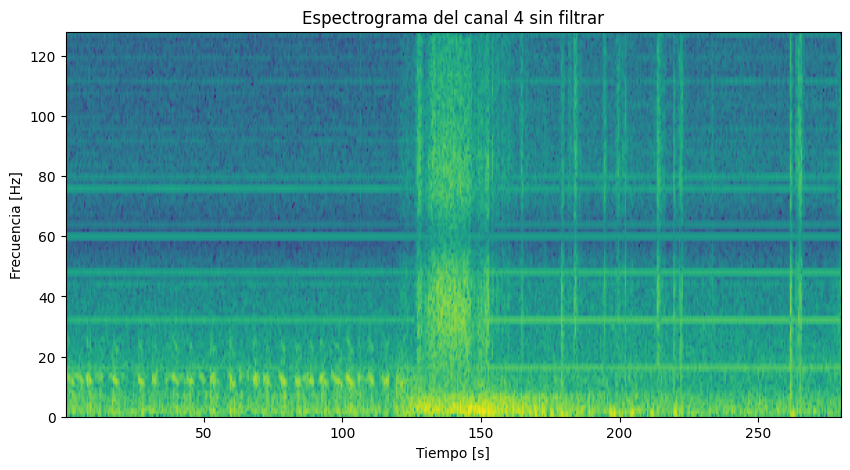

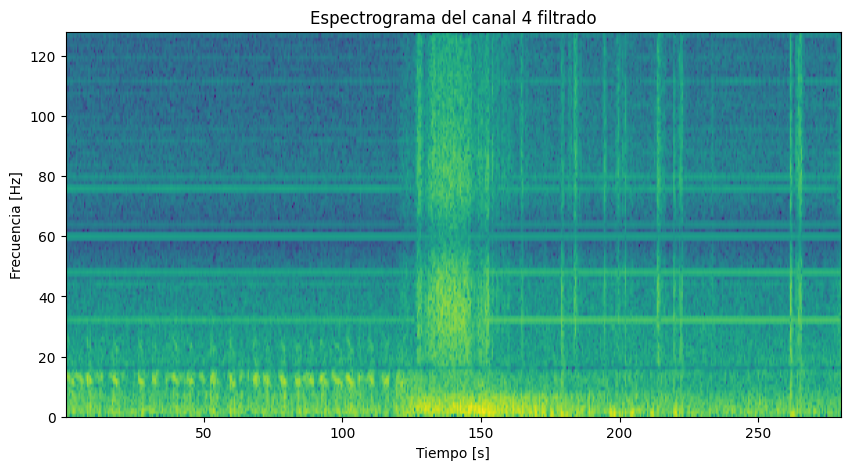

In [ ]:
plt.figure(figsize=(10,5))
plt.specgram(x[canal], Fs = fs)
plt.title('Espectrograma del canal 4 sin filtrar')
plt.xlabel('Tiempo [s]')
plt.ylabel('Frecuencia [Hz]')
plt.show()

plt.figure(figsize=(10,5))
plt.specgram(filtrada, Fs = fs)
plt.title('Espectrograma del canal 4 filtrado')
plt.xlabel('Tiempo [s]')
plt.ylabel('Frecuencia [Hz]')
plt.show()

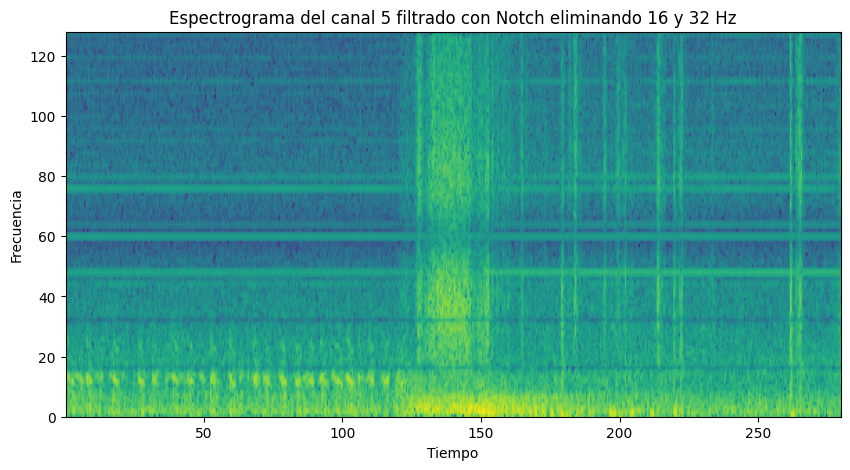

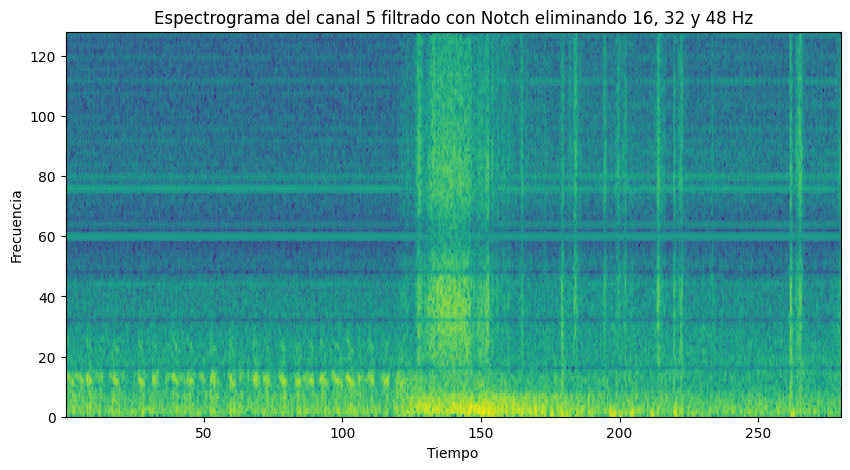

In [ ]:
N = 5 #orden
wn = [31,33]

[b,a] = scipy.signal.butter(N, wn, btype = 'bandstop', output = 'ba', fs = fs)

filtrada = scipy.signal.filtfilt(b, a, filtrada)

plt.figure(figsize=(10,5))
plt.specgram(filtrada, Fs = fs)
plt.title('Espectrograma del canal 5 filtrado con Notch eliminando 16 y 32 Hz')
plt.xlabel('Tiempo')
plt.ylabel('Frecuencia')
plt.show()

N = 5 #orden
wn = [47,49]

[b,a] = scipy.signal.butter(N, wn, btype = 'bandstop', output = 'ba', fs = fs)

filtrada = scipy.signal.filtfilt(b, a, filtrada)

plt.figure(figsize=(10,5))
plt.specgram(filtrada, Fs = fs)
plt.title('Espectrograma del canal 5 filtrado con Notch eliminando 16, 32 y 48 Hz')
plt.xlabel('Tiempo')
plt.ylabel('Frecuencia')
plt.show()

<font color = "yellow">En vez de aplicar tantas veces un Notch, ¿qué filtro nos conviene usar para este tipo de ruido?</font>

[scipy.signal.iircomb()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.iircomb.html?highlight=comb#scipy.signal.iircomb)

In [ ]:
from scipy.signal import iircomb

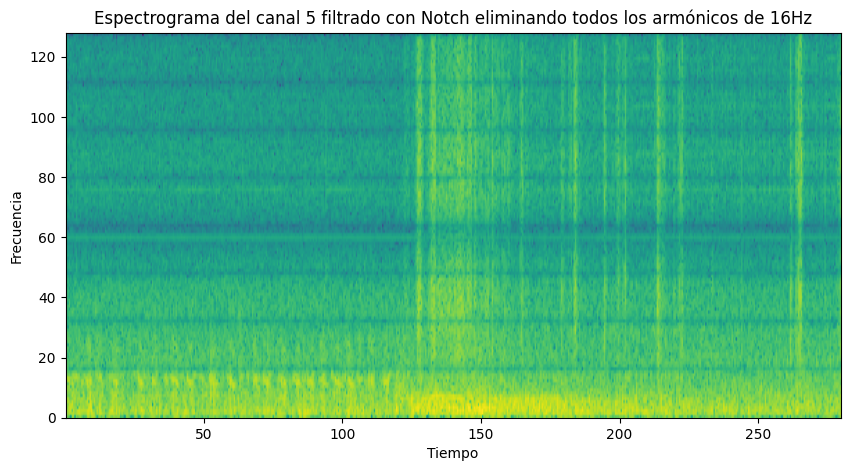

In [ ]:
b,a = iircomb(w0=16,Q=16/2,ftype='notch',fs=fs )
filtrada = scipy.signal.filtfilt(b, a, x[5])

plt.figure(figsize=(10,5))
plt.specgram(filtrada, Fs = fs)
plt.title('Espectrograma del canal 5 filtrado con Notch eliminando todos los armónicos de 16Hz')
plt.xlabel('Tiempo')
plt.ylabel('Frecuencia')
plt.show()

# SEGMENTACIÓN DE EEG

## Supuestos y Restricciones

<font color = "yellow">¿Qué asumimos para el EEG para poder hacer la segmentación? ¿Qué ventajas tenemos por asumir esto? </font>

## Segmentación

<font color = "yellow">¿Por qué segmentar a una tira de EEG? ¿Hay algún límite? </font>

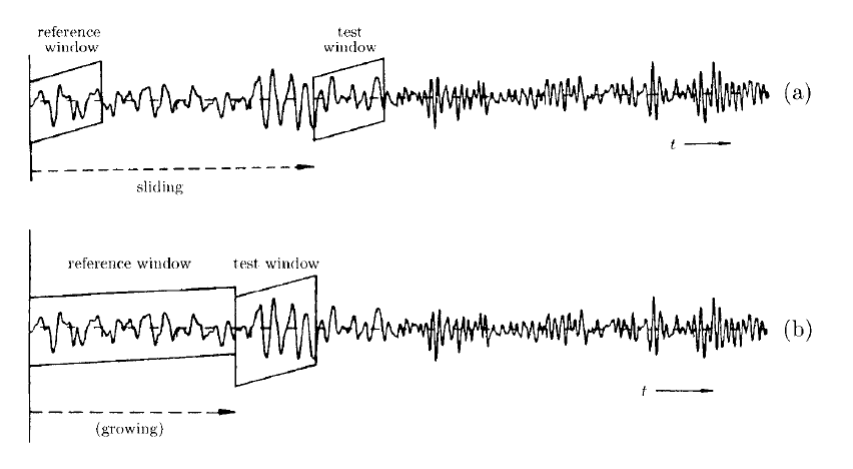

Asumimos que:

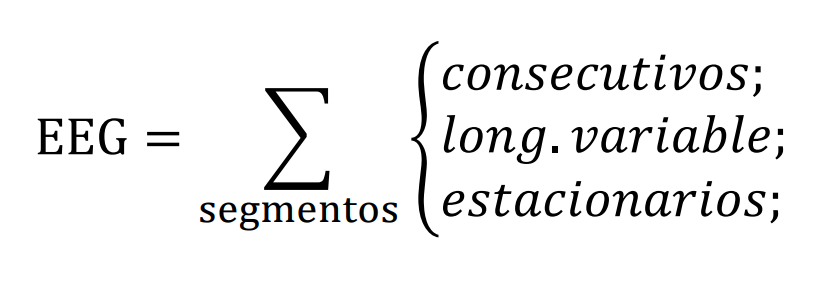

### Periodograma

**PERIODOGRAMA MÓVIL**

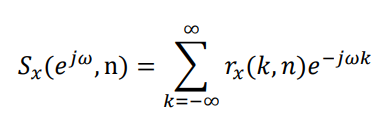

Voy a tener el periodograma desplazado ($r_x(k,n)$) y el de la ventana de referencia ($r_x(k,0)$)



> $n$: posicion variable de la ventana

> $k$: parámetro que indica el desplazamiento para calcular la correlación de la ventana en $n$

DISIMILITUD:

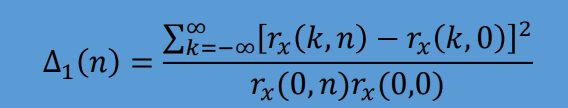

k : desplazamiento (interno)

n: tiempo donde calculo el coef. de disimilitud

#### CÓDIGO

Agarremos el canal 10

In [ ]:
canal = 10
senal = x[canal]

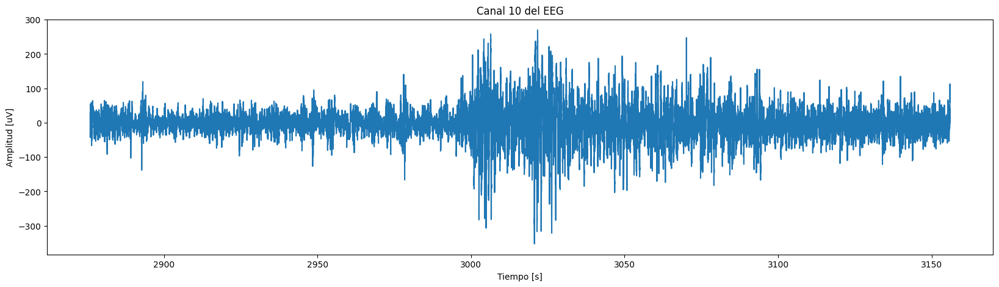

In [ ]:
plt.figure(figsize=(20,5))
plt.plot(t,senal)
plt.title(f'Canal {canal} del EEG')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.show()

[plt.acorr()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.acorr.html)


> No cuenta con la opción de correlación sesgada --> no funciona para calcular el delta real de la ecuación (sesgado)

> Devuelve el gráfico de la autocorrelación de manera automática



[numpy.correlate()](https://numpy.org/doc/stable/reference/generated/numpy.correlate.html)

> Sí cuenta con la opción de correlación sesgada --> mode = 'full'

> No devuelve el gráfico de la autocorrelación de manera automática


Se requieren dos ventanas para el análisis
* Ventana de referencia ($R_W$)
* Ventana de testeo ($T_W$)

Recuerdo la ecuación del coeficiente de disimilud:

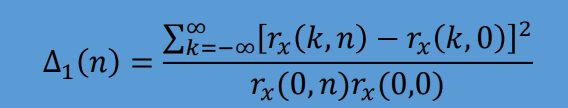

Vamos a tomar ventanas de largo `fs` (256 muestras = 1 segundo de señal), es decir, vamos a codear el Primer Abordaje.

In [ ]:
senal.shape[0]

71681

In [ ]:
N_win = fs
N_senal = senal.shape[0]

s_0 = senal[:N_win] # agarro la primer ventana --> ventana de referencia
r_0 = np.correlate(s_0,s_0,mode='full') # autocorrelación de la ventana de referencia

In [ ]:
r_0.shape

(511,)

In [ ]:
r_0/r_0.shape[0] #normalizar

array([-1.14011345e+00, -2.37747078e+00, -3.80349018e+00, -4.62154866e+00,
       -4.77488327e+00, -5.27267929e+00, -5.86398477e+00, -6.35744888e+00,
       -7.01134297e+00, -7.36648476e+00, -7.01313548e+00, -6.33399682e+00,
       -4.84344693e+00, -2.54820772e+00,  5.80326337e-02,  2.51325370e+00,
        4.73873425e+00,  6.67128817e+00,  8.32286555e+00,  9.74515055e+00,
        1.02646061e+01,  9.52287884e+00,  7.95988151e+00,  5.74321416e+00,
        3.81051086e+00,  2.51250682e+00,  1.96646231e+00,  2.35864938e+00,
        3.79632013e+00,  6.23675295e+00,  9.61392360e+00,  1.36818096e+01,
        1.77810645e+01,  2.23038009e+01,  2.73212710e+01,  3.21452990e+01,
        3.64178303e+01,  3.89174161e+01,  3.93497853e+01,  3.75828896e+01,
        3.37664037e+01,  2.79780032e+01,  2.08644870e+01,  1.29775010e+01,
        5.56657686e+00, -2.64694535e-01, -4.04458328e+00, -5.49405474e+00,
       -4.53095202e+00, -1.17320027e+00,  4.97534606e+00,  1.39354503e+01,
        2.43374824e+01,  

In [ ]:
r_0[len(r_0)//2] #potencia de la señal de referencia

255266.5333852147

In [ ]:
len(r_0)

511

In [ ]:
N_senal = senal.shape[0]
N_win = int(fs)

porcentaje = 0.75 # PORCENTAJE DE SOLAPAMIENTO

paso =  int((1-porcentaje)*N_win) # 75% de solapamiento  --> (N_win/4)

s_0 = senal[:N_win]
R_0 = np.correlate(s_0,s_0,mode='full')/s_0.shape[0]
R_00 = R_0[int(R_0.shape[0]/2)]

In [ ]:
delta = []

for i in range(N_win, N_senal-N_win, paso):
  s_N = senal[i:i+N_win] #ventana de testeo (movil)
  R_N = np.correlate(s_N,s_N,mode='full')/s_N.shape[0] #autocorrelacion de ventana de testeo
  R_N0 = R_N[int(R_N.shape[0]/2)] #potencia de ventana de testeo
  d = np.sum((R_N-R_0)**2)/(R_N0*R_00)
  delta.append(d)

In [ ]:
len(delta)

1113

In [ ]:
senal.shape

(71681,)

In [ ]:
delta = delta/max(delta)
senal = senal/max(senal)

In [ ]:
delta_0 = scipy.signal.resample(delta, int(senal.shape[0]/fs)) # resampleo para poder graficar

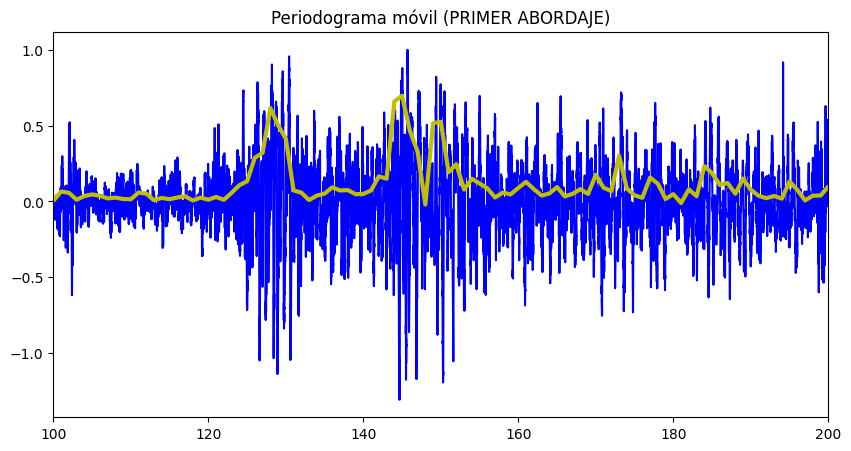

In [ ]:
plt.figure(figsize=(10,5)) # Se pierden las escalas de amplitud del gráfico para mejorar la comparación
plt.title('Periodograma móvil (PRIMER ABORDAJE)')
plt.plot(t_reset,senal,'b')
plt.plot(delta_0,'y',linewidth=3)
plt.xlim([100,200])
plt.show()

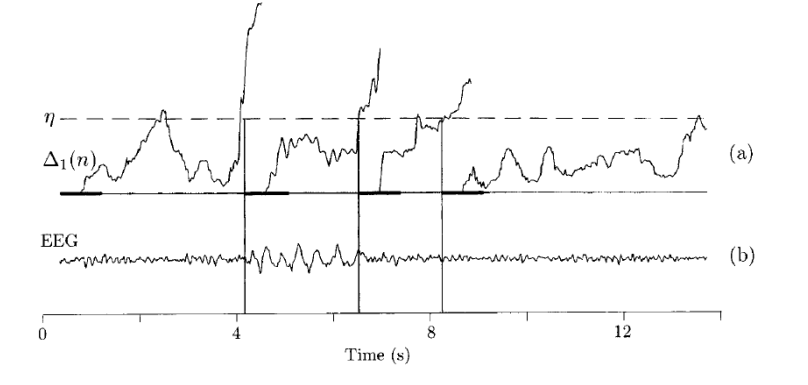

#### TAREA

Realizar el segundo abordaje

In [ ]:
#umbral = 0.25*max(delta_0)

"""
def segmentacion(,,porcentaje_solapamiento,umbral):
  if delta[] > umbral =
    senal_segmentada.append(senal[])
  return senal_segmentada"""

### Paramétrica (TAREA)